In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import numpy as np

import os
import re
import sys
import glob
import time
import tarfile
from six.moves import urllib
import pickle

import argparse
import tempfile
import pandas as pd

import scipy
from scipy.stats import f_oneway
import scipy.stats as stats

from random import shuffle

from sklearn import ensemble as ens
from sklearn import metrics as met
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.formula.api as smf

import seaborn as sns
# import plotly.graph_objects as go
# import plotly.express as px

print(os.getcwd() + "\n")

/Volumes/Gabor_SSD/ML/gabor_venv_tensor/jupyterNotebook



In [67]:
# data files input 
path = "/Volumes/Gabor_SSD/ML/gabor_venv_tensor/jupyterNotebook/SensDog_Bout_article_Royal_Society_Open_Science/Data/Sztaki_Balint_filtered_56_list/"
path_base = "/Volumes/WD_Black_2TB/SensDog_Bout_Article_POS_Computing/"

# OUTPUT
# Features and models results
path_results = path_base + "Results/"
path_models = path_base + "Models/"
path_figures = path_base + "Figures/"

fname_result = path_results + 'apr01_2022_results_all_sensdog_LGBM_Threshold_SMOTE_2.csv'
df_input = pd.read_csv(fname_result, sep=',', index_col=False)

In [68]:
label_list = ['<80','80-149','150<']
window_list = [15, 32, 60, 81, 120, 149, 200, 300]
category = pd.cut(df_input.bout_median,bins=[0,79,149,500],labels=label_list)
df_input.insert(4,'bout_median_groups',category)
df = df_input.copy()

In [69]:
df = df[df.auc_vl > 0.5]
# df = df[~df.label.str.contains("_")]
# df = df[~df.label.str.contains("spin")]
# df = df[~df.label.str.contains("playbow")]
# df = df[df['window_size'] != 15]
# df = df[df['window_size'] != 32]
# df = df[df.label.str.contains("drink")]
# df = df[df['num_pos'] > 4000]
# df = df[df['window_size'] == 100]

In [70]:
df

,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans
0,0,15,0,1,80-149,0.989427,0.770180,0.011385,0.097826,36,3162,368,spin,85.0,0.003291,0.704988
1,0,15,0,2,<80,0.512295,0.755833,0.438647,0.573448,33217,75726,57925,stand,76.0,0.414510,0.687318
2,0,15,0,3,150<,0.662000,0.830078,0.318996,0.608412,13713,42988,22539,sit,173.0,0.296800,0.754253
3,0,15,0,4,150<,0.824852,0.690944,0.170857,0.474971,10181,59588,21435,lay,292.0,0.311713,0.643535
4,0,15,0,5,<80,0.609238,0.827039,0.544098,0.661084,43221,79436,65379,walk,61.0,0.370932,0.737695
5,0,15,0,6,80-149,0.643324,0.944637,0.505778,0.787624,16763,33143,21283,trot,85.0,0.264071,0.877227
6,0,15,0,7,<80,0.634353,0.969358,0.498954,0.793398,9301,18641,11723,run,65.0,0.123942,0.922835
7,0,15,0,8,<80,0.953944,0.892502,0.062008,0.221382,205,3306,926,prance,43.0,0.018705,0.824275
8,0,15,0,9,<80,0.927429,0.941487,0.047564,0.624143,455,9566,729,jump,40.0,0.084433,0.882763
9,0,15,0,10,<80,0.983407,0.868217,0.025182,0.218487,104,4130,476,hop,20.0,0.008693,0.798812


In [71]:
df = df.replace({'lay': 'lie'}, regex=True)

In [72]:
df = df.replace({'pliebow': 'playbow'}, regex=True)

In [73]:
df

,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans
0,0,15,0,1,80-149,0.989427,0.770180,0.011385,0.097826,36,3162,368,spin,85.0,0.003291,0.704988
1,0,15,0,2,<80,0.512295,0.755833,0.438647,0.573448,33217,75726,57925,stand,76.0,0.414510,0.687318
2,0,15,0,3,150<,0.662000,0.830078,0.318996,0.608412,13713,42988,22539,sit,173.0,0.296800,0.754253
3,0,15,0,4,150<,0.824852,0.690944,0.170857,0.474971,10181,59588,21435,lie,292.0,0.311713,0.643535
4,0,15,0,5,<80,0.609238,0.827039,0.544098,0.661084,43221,79436,65379,walk,61.0,0.370932,0.737695
5,0,15,0,6,80-149,0.643324,0.944637,0.505778,0.787624,16763,33143,21283,trot,85.0,0.264071,0.877227
6,0,15,0,7,<80,0.634353,0.969358,0.498954,0.793398,9301,18641,11723,run,65.0,0.123942,0.922835
7,0,15,0,8,<80,0.953944,0.892502,0.062008,0.221382,205,3306,926,prance,43.0,0.018705,0.824275
8,0,15,0,9,<80,0.927429,0.941487,0.047564,0.624143,455,9566,729,jump,40.0,0.084433,0.882763
9,0,15,0,10,<80,0.983407,0.868217,0.025182,0.218487,104,4130,476,hop,20.0,0.008693,0.798812


In [12]:
df.groupby(['bout_median_groups']).size().reset_index(name='counts')

,bout_median_groups,counts
0,<80,2388
1,80-149,694
2,150<,1115


In [13]:
df.groupby(['label']).size().reset_index(name='counts')

,label,counts
0,back,240
1,bodyshake,240
2,chew,218
3,drink,240
4,eat,240
5,hop,240
6,jump,240
7,lie,240
8,pliebow,229
9,prance,239


In [14]:
print (df.dtypes)

run                      int64
window_size              int64
fold_id                  int64
category_id              int64
bout_median_groups    category
pr_auc_vl              float64
auc_vl                 float64
prec                   float64
recall                 float64
true_pos                 int64
pos_predicted            int64
num_pos                  int64
label                   object
bout_median            float64
threshold              float64
gmeans                 float64
dtype: object


In [15]:
df['fold_id'] = df.fold_id.astype('category')
df['label'] = df.label.astype('category')
df['run'] = df.run.astype('category')
#df['window_size'] = df.window_size.astype('category')

In [16]:
print (df.dtypes)

run                   category
window_size              int64
fold_id               category
category_id              int64
bout_median_groups    category
pr_auc_vl              float64
auc_vl                 float64
prec                   float64
recall                 float64
true_pos                 int64
pos_predicted            int64
num_pos                  int64
label                 category
bout_median            float64
threshold              float64
gmeans                 float64
dtype: object


In [17]:
df.groupby(['label']).mean()

/var/folders/bz/6w0_xvb96fs9l9g82rgxvcqm0000gp/T/ipykernel_1413/3537778081.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby(['label']).mean()


,window_size,category_id,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,bout_median,threshold,gmeans
label,,,,,,,,,,,,
back,119.625000,23.0,0.984965,0.711632,0.026520,0.067942,33.612500,1407.504167,422.833333,40.0,0.021672,0.658476
bodyshake,119.625000,30.0,0.634561,0.936876,0.407273,0.528983,87.970833,215.337500,160.708333,66.0,0.003174,0.919573
chew,116.399083,32.0,0.959018,0.710114,0.063649,0.128054,128.467890,2791.082569,1241.366972,87.0,0.041589,0.657426
drink,119.625000,27.0,0.658825,0.916670,0.540239,0.305642,313.529167,614.354167,1156.000000,311.5,0.006646,0.844281
eat,119.625000,26.0,0.781299,0.857317,0.333660,0.217925,388.795833,1447.745833,1985.083333,365.0,0.013811,0.784091
hop,119.625000,10.0,0.956771,0.917159,0.060999,0.164233,37.425000,717.266667,203.750000,20.0,0.005157,0.852537
jump,119.625000,9.0,0.879089,0.915644,0.134393,0.346951,150.970833,1367.295833,411.666667,40.0,0.013728,0.867941
lie,119.625000,4.0,0.753647,0.718797,0.271912,0.386698,3642.679167,14783.908333,10370.041667,292.0,0.211512,0.667530
pliebow,118.956332,20.0,0.992223,0.742231,0.012420,0.003629,0.288210,124.052402,137.519651,40.0,0.000594,0.710735


In [74]:
pd.pivot_table(df, index = ['label'], values = 'num_pos', aggfunc={'num_pos': [np.median, np.mean, np.min, np.max]}).round(2)

,amax,amin,mean,median
label,,,,
back,1546,31,422.83,324.0
bodyshake,590,10,160.71,115.5
chew,4818,14,1241.37,908.5
drink,3569,35,1156.00,874.0
eat,7293,12,1985.08,1394.5
hop,781,17,203.75,160.5
jump,1606,19,411.67,332.5
lie,35690,850,10370.04,8073.5
playbow,649,1,137.52,91.0


In [19]:
df.groupby(['window_size']).mean()

/var/folders/bz/6w0_xvb96fs9l9g82rgxvcqm0000gp/T/ipykernel_1413/4145148854.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby(['window_size']).mean()


,category_id,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,bout_median,threshold,gmeans
window_size,,,,,,,,,,,
15,15.115530,0.820458,0.808744,0.208710,0.386183,5369.285985,15163.827652,8991.236742,121.003788,0.140696,0.751156
32,14.902672,0.799257,0.835258,0.259448,0.414425,5782.801527,14568.227099,9038.202290,119.095420,0.136541,0.777907
60,15.175803,0.798333,0.844717,0.270386,0.388390,4813.117202,11292.236295,7473.669187,120.143667,0.120608,0.789327
81,15.209738,0.792464,0.849691,0.285047,0.386196,3525.028090,8058.265918,5547.913858,121.601124,0.114625,0.795641
120,14.879079,0.783866,0.850129,0.295241,0.372057,2313.218810,5322.017274,3785.086372,118.186180,0.109783,0.795663
149,14.938580,0.779294,0.848032,0.290570,0.363309,1942.917466,4511.435701,3243.539347,118.094050,0.105450,0.793173
200,14.906489,0.778441,0.835344,0.279030,0.336370,1297.479008,3018.343511,2253.992366,118.190840,0.097777,0.780126
300,14.773256,0.784323,0.830692,0.266571,0.302633,801.678295,1902.957364,1520.143411,118.492248,0.091535,0.779831


In [20]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.pivot_table(df, index = ['label', 'window_size'], values = 'auc_vl', aggfunc={'auc_vl': ['count',np.median, np.std]})

count    median       std
label     window_size                           
back      15              30  0.712386  0.074370
          32              30  0.741203  0.062124
          60              30  0.740957  0.062430
          81              30  0.739717  0.051238
          120             30  0.707613  0.044949
          149             30  0.723162  0.055057
          200             30  0.686531  0.052402
          300             30  0.673994  0.047609
bodyshake 15              30  0.912310  0.073965
          32              30  0.953093  0.053477
          60              30  0.982788  0.099934
          81              30  0.988063  0.075517
          120             30  0.989735  0.071519
          149             30  0.978328  0.074205
          200             30  0.981361  0.064939
          300             30  0.990190  0.046944
chew      15              29  0.704735  0.093214
          32              25  0.728826  0.101851
          60              29  0.735772  0.091755
          81              28  0.778644  0.113152
          120             28  0.744706  0.106256
          149             28  0.773839  0.100249
          200             27  0.707081  0.095031
          300             24  0.678100  0.084341
drink     15              30  0.864919  0.048192
          32              30  0.915090  0.034269
          60              30  0.940801  0.041956
          81              30  0.933948  0.037686
          120             30  0.945091  0.031467
          149             30  0.937283  0.040517
          200             30  0.927085  0.029356
          300             30  0.919818  0.048097
eat       15              30  0.789561  0.056146
          32              30  0.843693  0.044282
          60              30  0.856955  0.065285
          81              30  0.858625  0.071847
          120             30  0.872042  0.059670
          149             30  0.879415  0.077229
          200             30  0.877224  0.052210
          300             30  0.910243  0.053072
hop       15              30  0.891989  0.026835
          32              30  0.929075  0.018906
          60              30  0.939398  0.011963
          81              30  0.933836  0.017954
          120             30  0.916697  0.021007
          149             30  0.915790  0.021641
          200             30  0.913537  0.021470
          300             30  0.901891  0.017870
jump      15              30  0.930222  0.049533
          32              30  0.944494  0.053297
          60              30  0.951281  0.069737
          81              30  0.944542  0.059296
          120             30  0.934444  0.059732
          149             30  0.940741  0.050467
          200             30  0.914225  0.041457
          300             30  0.906455  0.051620
lie       15              30  0.696198  0.070637
          32              30  0.706200  0.068181
          60              30  0.729235  0.069273
          81              30  0.727335  0.064579
          120             30  0.723318  0.072095
          149             30  0.720829  0.064828
          200             30  0.752523  0.060736
          300             30  0.756712  0.079860
pliebow   15              26  0.670100  0.068137
          32              30  0.671992  0.056571
          60              30  0.784872  0.067359
          81              30  0.774073  0.099180
          120             27  0.789619  0.075429
          149             29  0.772326  0.112520
          200             30  0.731275  0.082672
          300             27  0.780279  0.113059
prance    15              30  0.767056  0.081954
          32              30  0.716641  0.109476
          60              30  0.778435  0.101198
          81              30  0.764691  0.102900
          120             30  0.788172  0.076710
          149             29  0.772008  0.090602
          200             30  0.753459  0.094407
          300             30  0.750004  0.098961
run  

In [21]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.pivot_table(df, index = ['label', 'window_size'], values = 'pr_auc_vl', aggfunc={'pr_auc_vl': ['count',np.median, np.std]})

count    median       std
label     window_size                           
back      15              30  0.987414  0.007514
          32              30  0.984993  0.008676
          60              30  0.980987  0.006406
          81              30  0.982565  0.009096
          120             30  0.986081  0.008202
          149             30  0.987226  0.006098
          200             30  0.990413  0.003830
          300             30  0.990396  0.007964
bodyshake 15              30  0.643375  0.102962
          32              30  0.575923  0.065625
          60              30  0.614943  0.108051
          81              30  0.636201  0.101394
          120             30  0.575374  0.086378
          149             30  0.623697  0.109885
          200             30  0.623738  0.090954
          300             30  0.660469  0.082704
chew      15              29  0.975519  0.008568
          32              25  0.970582  0.019570
          60              29  0.962967  0.015639
          81              28  0.955359  0.016363
          120             28  0.957797  0.045765
          149             28  0.955985  0.035707
          200             27  0.960450  0.018678
          300             24  0.971649  0.019476
drink     15              30  0.775229  0.114108
          32              30  0.646156  0.111310
          60              30  0.592541  0.124011
          81              30  0.613466  0.073568
          120             30  0.601529  0.079544
          149             30  0.578649  0.110103
          200             30  0.608725  0.076948
          300             30  0.676204  0.135494
eat       15              30  0.915046  0.063607
          32              30  0.803098  0.076570
          60              30  0.792118  0.095036
          81              30  0.798677  0.108211
          120             30  0.780626  0.121221
          149             30  0.733787  0.110562
          200             30  0.813203  0.111722
          300             30  0.713375  0.117466
hop       15              30  0.970927  0.016426
          32              30  0.946594  0.025099
          60              30  0.943692  0.022940
          81              30  0.951304  0.026467
          120             30  0.963446  0.017054
          149             30  0.966993  0.020152
          200             30  0.971557  0.009989
          300             30  0.974923  0.009803
jump      15              30  0.902352  0.041049
          32              30  0.872847  0.052905
          60              30  0.859237  0.051670
          81              30  0.861262  0.065916
          120             30  0.885542  0.055936
          149             30  0.878782  0.046480
          200             30  0.904059  0.043828
          300             30  0.935111  0.033580
lie       15              30  0.779895  0.065030
          32              30  0.773953  0.050346
          60              30  0.766101  0.046965
          81              30  0.750818  0.055421
          120             30  0.755730  0.059830
          149             30  0.745920  0.066191
          200             30  0.742062  0.057071
          300             30  0.732873  0.065950
pliebow   15              26  0.998262  0.001042
          32              30  0.996976  0.002940
          60              30  0.993912  0.006341
          81              30  0.993986  0.006980
          120             27  0.992776  0.007245
          149             29  0.994212  0.005324
          200             30  0.994384  0.007675
          300             27  0.988932  0.016680
prance    15              30  0.969068  0.020217
          32              30  0.962117  0.043666
          60              30  0.957786  0.024702
          81              30  0.948323  0.051679
          120             30  0.965952  0.042467
          149             29  0.955937  0.042240
          200             30  0.930382  0.056728
          300             30  0.957392  0.037805
run  

# Bout length group

In [75]:
# currentLabel = window_list[6]

# a given behaviour element (label)

# CHANGE LABEL HERE --->
currentLabel = 'walk'

# dfLabel = df[df.label==currentLabel]

dfLabel = df[(df.label=='eat') | (df.label=='walk')| (df.label=='trot')| (df.label=='run')| (df.label=='lie')| (df.label=='sit')| (df.label=='lie')]
# dfLabel = df.loc[(df.label=='eat') | (df.label=='walk')| (df.label=='trot')| (df.label=='run')| (df.label=='lay')| (df.label=='sit')| (df.label=='lay')]
# a given bout group
# currentLabel = 'bout median group 80-149 (<1.2 sec)'


# currentLabel = '<81 (<1.2 sec)'
# currentLabel = '81-149 (1.2 sec - 2.5 sec)'
# currentLabel = '150< (2.5 sec<)'
# dfLabel = df[df.bout_median_groups==label_list[2]]



# grouped = df.groupby(df.window_size)
# Walk = grouped.get_group(currentLabel)
# print(Walk)
print (dfLabel)

      run  window_size  fold_id  category_id bout_median_groups  pr_auc_vl  \
2       0           15        0            3               150<   0.662000   
3       0           15        0            4               150<   0.824852   
4       0           15        0            5                <80   0.609238   
5       0           15        0            6             80-149   0.643324   
6       0           15        0            7                <80   0.634353   
12      0           15        0           26               150<   0.949286   
20      0           15        1            3               150<   0.690585   
21      0           15        1            4               150<   0.725690   
22      0           15        1            5                <80   0.713191   
23      0           15        1            6             80-149   0.680587   
24      0           15        1            7                <80   0.657641   
30      0           15        1           26               150< 

In [23]:
# dfLabel = df.loc[(df['window_size'] == window_list[4]) | (df['window_size'] == window_list[4]) | (df['window_size'] == window_list[4]) | (df['window_size'] == window_list[5]) | (df['window_size'] == window_list[5])]
# dfLabel = dfLabel.loc[(dfLabel['bout_median_groups'] == label_list[1]) | (dfLabel['bout_median_groups'] == label_list[2])]
# pd.pivot_table(dfLabel, index = ['label', 'window_size'], values = 'auc_vl', aggfunc={'auc_vl': ['count',np.median, np.std]})
# dfLabel.groupby(['bout_median_groups']).mean()
# dfLabel.count
# dfLabel.describe().T

In [57]:
pd.pivot_table(data=dfLabel, index=['label'], values=['auc_vl', 'bout_median'], aggfunc={'auc_vl': ['count',np.median, np.std],'bout_median': 'median'}).reset_index().rename(columns={'auc_vl': 'AUC', 'bout_median_groups': 'Bout median group'})
# pd.pivot_table(data=dfLabel, index=['bout_median_groups'], values=['auc_vl', 'bout_median'], aggfunc={'auc_vl': ['count',np.median, np.std],'bout_median': 'median'}).reset_index().rename(columns={'auc_vl': 'AUC', 'bout_median_groups': 'Bout median group'})

label   AUC                     bout_median
        count    median       std      median
0   eat   240  0.863425  0.066528       365.0
1   lie   240  0.725995  0.070721       292.0
2   run   240  0.975778  0.007604        65.0
3   sit   240  0.848696  0.029388       173.0
4  trot   240  0.939248  0.023658        85.0
5  walk   240  0.864505  0.037931        61.0

# ANOVA

In [25]:
# dfLabel = df[df.window_size==currentLabel]
median = dfLabel.bout_median_groups.unique()
# dfLabel[dfLabel.bout==15].auc_vl.reset_index()

# 
# stat, p = f_oneway(dfLabel[dfLabel.bout_median_groups==window_list[0]].prec, dfLabel[dfLabel.window==label_list[1]].prec, dfLabel[dfLabel.window_list==label_list[2]].prec)
# stat, p = f_oneway(dfLabel[dfLabel.bout_median_groups==label_list[0]].prec, dfLabel[dfLabel.bout_median_groups==label_list[1]].prec, dfLabel[dfLabel.bout_median_groups==label_list[2]].prec)
# by window size
stat, p = f_oneway(dfLabel[dfLabel.window_size==window_list[0]].auc_vl,dfLabel[dfLabel.window_size==window_list[1]].auc_vl,dfLabel[dfLabel.window_size==window_list[2]].auc_vl,dfLabel[dfLabel.window_size==window_list[3]].auc_vl,dfLabel[dfLabel.window_size==window_list[4]].auc_vl)


plot_str = ('\n Behaviour element: %s \n ANOVA One-way:(stat=%.3f, p=%.3f)' % (currentLabel,stat, p))
print(plot_str)
if p > 0.001:
	print('Probably the same distribution')
else:
	print('Probably different distributions')

# fig, ax = plt.subplots(figsize=(20,8))
# df[(df.label == currentLabel)].boxplot(column=['auc_vl'], by=['label','bout'], ax=ax)


 Behaviour element: walk 
 ANOVA One-way:(stat=3.774, p=0.006)
Probably the same distribution


# Graph

In [26]:
from matplotlib.font_manager import fontManager, FontProperties

path = "/Users/gabor/Library/Fonts/Aller_Lt.ttf"
fontManager.addfont(path)

prop = FontProperties(fname=path)

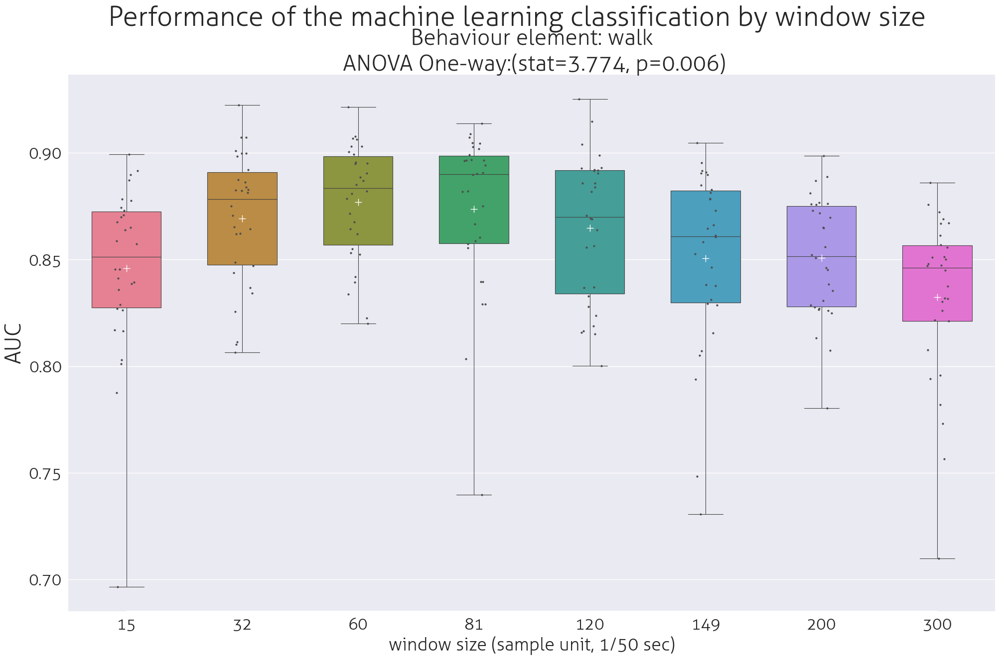

In [27]:
import matplotlib.pyplot as plt


sns.set_theme(style="whitegrid")
sns.set(font=prop.get_name())

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(24, 14))

# fig.suptitle(str(currentLabel)+' AUC by bout mean group', fontsize=40)
fig.suptitle('Performance of the machine learning classification by window size', fontsize=40)


# Plot the orbital period with horizontal boxes
sns.boxplot(x=dfLabel.window_size, y=dfLabel.auc_vl, data=dfLabel.auc_vl,
            whis=[0, 100], width=.6, palette="husl", linewidth = 0.8, showmeans=True,
                       meanprops={"marker": "+", 
                       "markeredgecolor": "white", 
                       "markersize": "10"})

# Add in points to show each observation
sns.stripplot(x=dfLabel.window_size, y=dfLabel.auc_vl, data=dfLabel.auc_vl,
              size=3, color=".3", linewidth=0)

# Tweak the visual presentation
ax.yaxis.grid(True)
sns.despine(trim=True, left=True)

plt.title(plot_str, size=32)
plt.xlabel('window size (sample unit, 1/50 sec)', size =26)
plt.ylabel('AUC',fontsize=32)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

fileName = path_figures + str(currentLabel)+'_bout_window_size_by_behaviour_' +'ANOVA_graph.png'

plt.savefig(fileName)

In [28]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import r2_score

linear_regression = linear_model.LinearRegression(fit_intercept=True)
create_cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
create_highdegree = PolynomialFeatures(degree=7, interaction_only=False, include_bias=False)
linear_predictor = make_pipeline(linear_regression)
#quadratic_predictor = make_pipeline(create_quadratic, linear_regression)
cubic_predictor = make_pipeline(create_cubic, linear_regression)

In [29]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

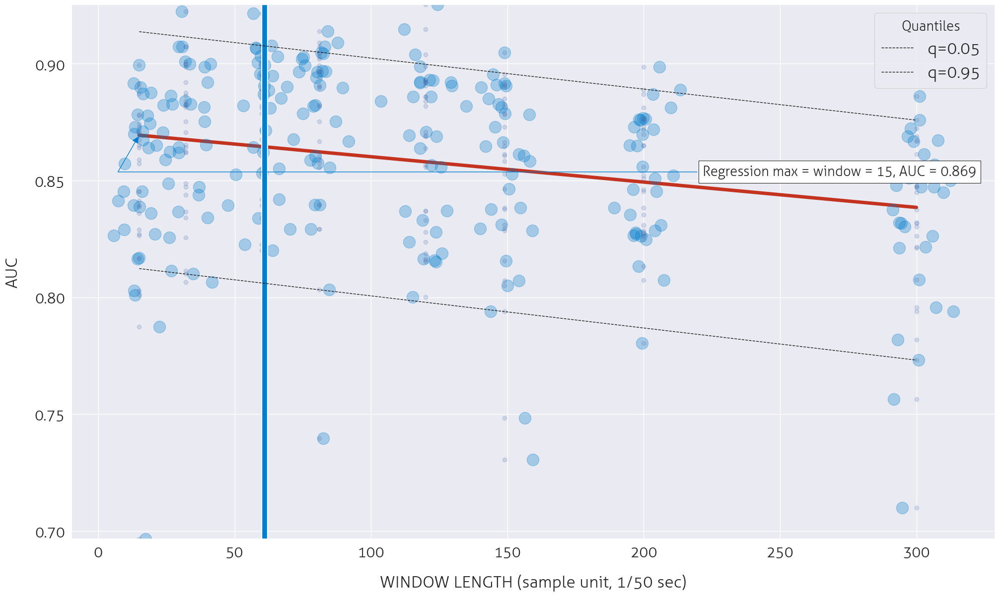

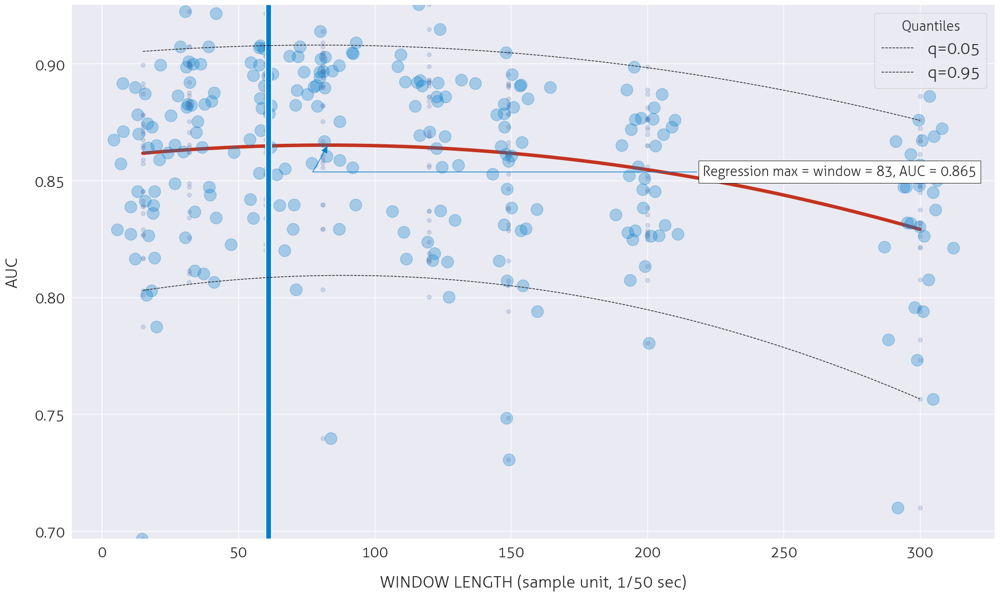

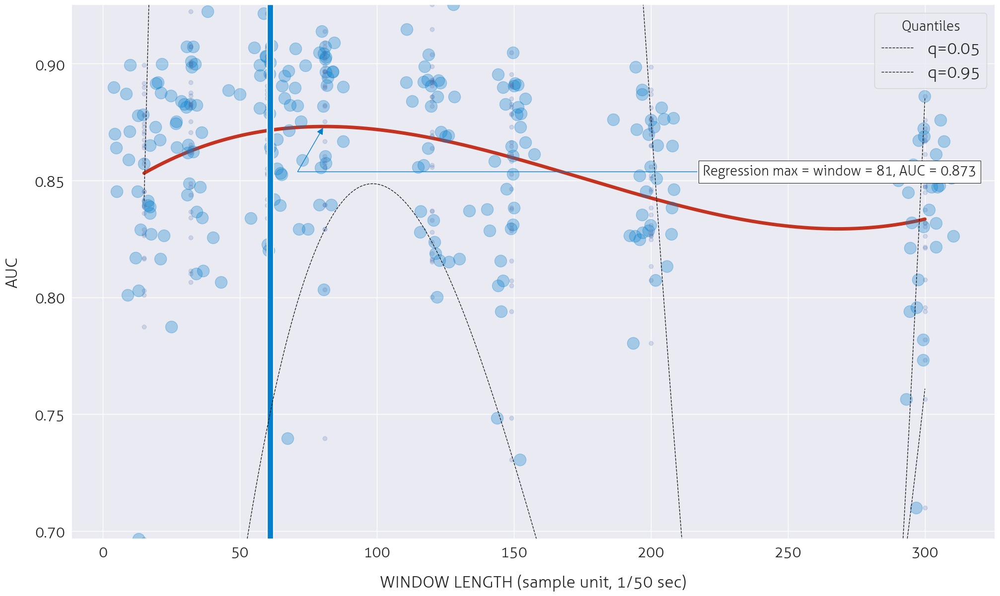

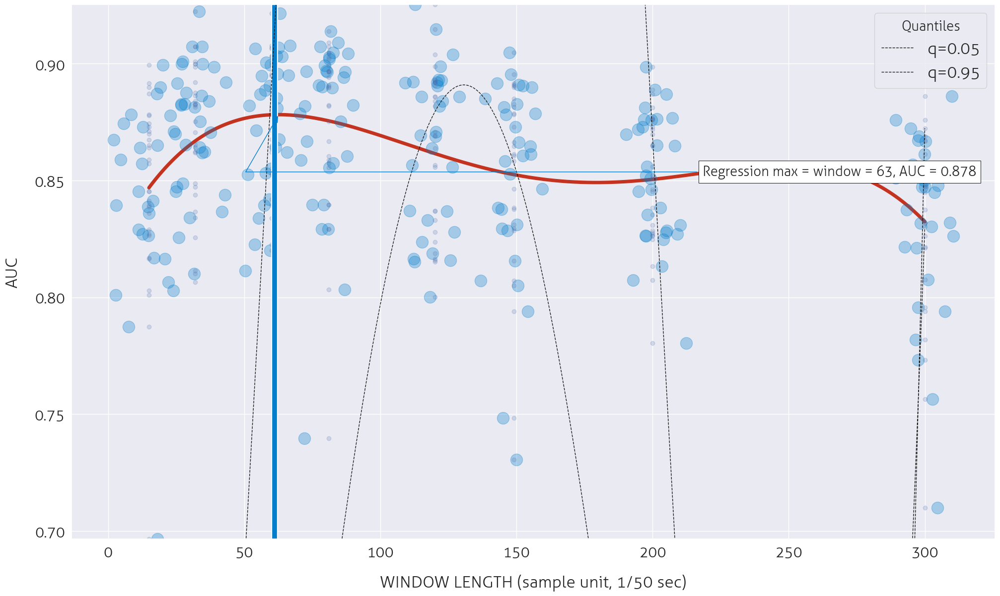

In [30]:
d = {'window_size': dfLabel.window_size, 'auc_vl': dfLabel.auc_vl}
df2 = pd.DataFrame(data=d)

# making jitter
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev

def annot_max(x,y, ax=None):
    xmax = x[np.argmax(y)]
    ymax = y.max()
    text= "Regression max = window = {:.0f}, AUC = {:.3f}".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="-|>",connectionstyle="angle,angleA=0,angleB=60",color = '#027ecc')
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top", fontsize=20)
    ax.annotate(text, xy=(xmax, ymax), xytext=(0.98,0.7), **kw)



# x1 = pd.DataFrame({'window_size': np.linspace(dfLabel.window_size.min(), dfLabel.window_size.max(), 240)})

# poly_2 = smf.ols(formula='auc_vl ~ window_size + I(window_size ** 2.0)', data=df).fit()

# fig, ax = plt.subplots(figsize=(24, 14))
# sns.set_theme(style="ticks")
# fig.suptitle('Performance of the machine learning classification by window length', font='Verdana', fontsize=40)

# plt.plot(dfLabel.window_size, dfLabel.auc_vl, 'o', alpha=0.2)
# plt.plot(x1.window_size, poly_2.predict(x1), 'r-', 
#          label='2nd order poly fit, $R^2$=%.2f' % poly_2.rsquared, 
#          alpha=0.9)
# plt.xlim((0, 350))
# plt.ylim((0.5, 1))
# plt.xlabel('window size')
# plt.ylabel('AUC')
# plt.legend(loc="upper left")

formulas = []
# 1-st order polynomial
formula_1 = 'auc_vl ~ window_size'
formulas.append(formula_1)
# 2-nd order polynomial
formula_2 = 'auc_vl ~ window_size + I(window_size ** 2.0)'
formulas.append(formula_2)
# 3-rd order polynomial
formula_3 = 'auc_vl ~ window_size + I(window_size ** 2.0) + I(window_size ** 3.0)'
formulas.append(formula_3)
# 4-rd order polynomial
formula_4 = 'auc_vl ~ window_size + I(window_size ** 2.0) + I(window_size ** 3.0) +I(window_size ** 4.0)'
formulas.append(formula_4)

for d in [1,2,3,4]:
    # with quantile regression

    # Least Absolute Deviation
    # The LAD model is a special case of quantile regression where q=0.5

    mod = smf.quantreg(formulas[d-1], df2)
    res = mod.fit()

    # Quantile regression for 5 quantiles

    quantiles = [.05, .95]

    # get all result instances in a list
    res_all = [mod.fit(q=q) for q in quantiles]

    res_ols = smf.ols(formula=formulas[d-1], data=df2).fit()
    
#     fname_summary = path_figures + str(currentLabel)+'_bout_window_size_by_behaviour_' + str(d) +'order_linear_summary.txt'
#     linearSummary = open(fname_summary,"w")
#     print('\n Behaviour element: %s \n %i order polynomial curve:(R2=%.3f, p=%.3f)' % (currentLabel,d,res_ols.rsquared, res_ols.f_pvalue))
#     print(res_ols.summary(yname = 'AUC'))
#     print(res_ols.summary(yname = 'AUC'),file=linearSummary)
#     linearSummary.flush()


    fig, ax = plt.subplots(figsize=(24, 14))
    
#     sns.set_theme(style="ticks")
#     sns.set_theme()
#     sns.set_style("whitegrid", {'grid.color': 'red'})
    sns.set(font=prop.get_name())
    # fig.suptitle('Performance of the machine learning classification by window length', y=0.93, fontsize=36)

    # create x for prediction
    x_p = np.linspace(dfLabel.window_size.min(), dfLabel.window_size.max(), 240)
    df_p = pd.DataFrame({'window_size': x_p})

    for qm, res in zip(quantiles, res_all):
        # get prediction for the model and plot
        # here we use a dict which works the same way as the df in ols
        plt.plot(x_p, res.predict({'window_size': x_p}), linestyle='--', lw=1, 
                 color='k', label='q=%.2F' % qm, zorder=2)

    y_ols_predicted = res_ols.predict(df_p)
    
    plt.plot(x_p, y_ols_predicted, linewidth=5, color='#c3331f', zorder=1)
    annot_max(x_p, y_ols_predicted)
    plt.scatter(rand_jitter(dfLabel.window_size), dfLabel.auc_vl,s=300, alpha=0.3, marker='o', color = '#027ecc')
    plt.plot(dfLabel.window_size, dfLabel.auc_vl, 'o', alpha=0.2, zorder=1)
    ax.yaxis.grid(True)
#     sns.despine(trim=True, left=True)
#     sns.set(font=prop.get_name())
    plot_2_str = ('Behaviour element: %s \n %i order polynomial curve:(R2=%.3f, p=%.3f)' % (currentLabel,d,res_ols.rsquared, res_ols.f_pvalue))
    # plt.title(plot_2_str, size=30, y=0.90)
    plt.xlabel('WINDOW LENGTH (sample unit, 1/50 sec)', size =24 ,rotation=0, labelpad=20)
    plt.ylabel('AUC',fontsize=24,rotation=90, labelpad=20 )
    plt.legend(title='Quantiles',title_fontsize=20,loc="upper right", fontsize=24)
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    # barplot of the median bout length
    x = (dfLabel.bout_median)
    y = (np.max(dfLabel.auc_vl))
    ax.set_ylim([np.min(dfLabel.auc_vl), np.max(dfLabel.auc_vl)])

    plt.bar(x,y,align='center', color = '#027ecc',width=2) # A bar chart
    fileName = path_figures + str(currentLabel)+'_bout_window_size_by_behaviour_' + str(d) +'order_linear_curve.png'
    # plt.savefig(fileName, dpi=150)

In [58]:
dfLabel

,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans
2,0,15,0,3,150<,0.662000,0.830078,0.318996,0.608412,13713,42988,22539,sit,173.0,0.296800,0.754253
3,0,15,0,4,150<,0.824852,0.690944,0.170857,0.474971,10181,59588,21435,lie,292.0,0.311713,0.643535
4,0,15,0,5,<80,0.609238,0.827039,0.544098,0.661084,43221,79436,65379,walk,61.0,0.370932,0.737695
5,0,15,0,6,80-149,0.643324,0.944637,0.505778,0.787624,16763,33143,21283,trot,85.0,0.264071,0.877227
6,0,15,0,7,<80,0.634353,0.969358,0.498954,0.793398,9301,18641,11723,run,65.0,0.123942,0.922835
12,0,15,0,26,150<,0.949286,0.642498,0.085747,0.042794,299,3487,6987,eat,365.0,0.002258,0.595097
20,0,15,1,3,150<,0.690585,0.848587,0.267404,0.369641,2854,10673,7721,sit,173.0,0.134333,0.784363
21,0,15,1,4,150<,0.725690,0.619468,0.330927,0.265869,5135,15517,19314,lie,292.0,0.122699,0.594254
22,0,15,1,5,<80,0.713191,0.872963,0.622841,0.757149,23009,36942,30389,walk,61.0,0.391932,0.798941
23,0,15,1,6,80-149,0.680587,0.950532,0.435667,0.861980,7026,16127,8151,trot,85.0,0.398712,0.888009


In [77]:
dfLabel2 = df.drop(df[(df.label=='spin') | (df.label=='prance')| (df.label=='jump')| (df.label=='hop')| (df.label=='playbow')| (df.label=='back') | (df.label=='drink') | (df.label=='chew') | (df.label=='scratch') | (df.label=='bodyshake') | (df.label=='turn')].index)
print('dfLabel2')
dfLabel2

dfLabel2


,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans
1,0,15,0,2,<80,0.512295,0.755833,0.438647,0.573448,33217,75726,57925,stand,76.0,0.414510,0.687318
2,0,15,0,3,150<,0.662000,0.830078,0.318996,0.608412,13713,42988,22539,sit,173.0,0.296800,0.754253
3,0,15,0,4,150<,0.824852,0.690944,0.170857,0.474971,10181,59588,21435,lie,292.0,0.311713,0.643535
4,0,15,0,5,<80,0.609238,0.827039,0.544098,0.661084,43221,79436,65379,walk,61.0,0.370932,0.737695
5,0,15,0,6,80-149,0.643324,0.944637,0.505778,0.787624,16763,33143,21283,trot,85.0,0.264071,0.877227
6,0,15,0,7,<80,0.634353,0.969358,0.498954,0.793398,9301,18641,11723,run,65.0,0.123942,0.922835
12,0,15,0,26,150<,0.949286,0.642498,0.085747,0.042794,299,3487,6987,eat,365.0,0.002258,0.595097
19,0,15,1,2,<80,0.523141,0.797612,0.442767,0.688845,16420,37085,23837,stand,76.0,0.423691,0.730175
20,0,15,1,3,150<,0.690585,0.848587,0.267404,0.369641,2854,10673,7721,sit,173.0,0.134333,0.784363
21,0,15,1,4,150<,0.725690,0.619468,0.330927,0.265869,5135,15517,19314,lie,292.0,0.122699,0.594254


In [78]:
dfLabel3 = dfLabel2.drop(dfLabel2[((dfLabel2.label=='lie') & (dfLabel2.window_size !=300)) | ((dfLabel2.label=='sit') & (dfLabel2.window_size !=120)) | ((dfLabel2.label=='stand') & (dfLabel2.window_size !=81))| ((dfLabel2.label=='walk') & (dfLabel2.window_size !=81))| ((dfLabel2.label=='trot') & (dfLabel2.window_size !=60))| ((dfLabel2.label=='run') & (dfLabel2.window_size !=60)) | ((dfLabel2.label=='eat') & (dfLabel2.window_size !=300))].index)
dfLabel3 = dfLabel3.sort_values('category_id')
dfLabel3['window size'] = 'Bout'
print('dfLabel3')
dfLabel3

dfLabel3


,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans,window size
1036,2,81,1,2,<80,0.548531,0.758839,0.424022,0.547200,7124,16801,13019,stand,76.0,0.329840,0.679813,Bout
2315,5,81,1,2,<80,0.625269,0.841581,0.522775,0.705035,8906,17036,12632,stand,76.0,0.408813,0.757392,Bout
589,1,81,0,2,<80,0.514089,0.770905,0.466076,0.627066,22765,48844,36304,stand,76.0,0.411191,0.706417,Bout
2333,5,81,2,2,<80,0.522078,0.774493,0.421668,0.718533,19067,45218,26536,stand,76.0,0.417526,0.708938,Bout
607,1,81,1,2,<80,0.502563,0.790481,0.409972,0.745316,13049,31829,17508,stand,76.0,0.499324,0.712407,Bout
3187,7,81,2,2,<80,0.571996,0.812860,0.478324,0.745701,18040,37715,24192,stand,76.0,0.477274,0.739680,Bout
625,1,81,2,2,<80,0.597788,0.798011,0.460515,0.708574,12777,27745,18032,stand,76.0,0.476478,0.712590,Bout
1442,3,81,0,2,<80,0.505414,0.745571,0.432602,0.669044,21204,49015,31693,stand,76.0,0.481351,0.693207,Bout
4022,9,81,1,2,<80,0.610837,0.775443,0.381358,0.673835,10466,27444,15532,stand,76.0,0.441200,0.712343,Bout
2297,5,81,0,2,<80,0.540403,0.706423,0.410753,0.624740,20414,49699,32676,stand,76.0,0.454467,0.671446,Bout


In [79]:
dfLabel4 = dfLabel2.drop(dfLabel2[((dfLabel2.label=='lie') & (dfLabel2.window_size ==300)) | ((dfLabel2.label=='sit') & (dfLabel2.window_size ==120)) | ((dfLabel2.label=='stand') & (dfLabel2.window_size ==81))| ((dfLabel2.label=='walk') & (dfLabel2.window_size ==81))| ((dfLabel2.label=='trot') & (dfLabel2.window_size ==60))| ((dfLabel2.label=='run') & (dfLabel2.window_size ==60)) | ((dfLabel2.label=='eat') & (dfLabel2.window_size ==300))].index)
dfLabel4 = dfLabel4.sort_values('category_id')
dfLabel4['window size'] = 'Not Bout'
print('dfLabel4')
dfLabel4

dfLabel4


,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans,window size
1,0,15,0,2,<80,0.512295,0.755833,0.438647,0.573448,33217,75726,57925,stand,76.0,0.414510,0.687318,Not Bout
823,1,300,1,2,<80,0.554275,0.734686,0.410425,0.514023,2126,5180,4136,stand,76.0,0.344780,0.663883,Not Bout
2279,5,60,2,2,<80,0.569213,0.828009,0.473924,0.804210,23918,50468,29741,stand,76.0,0.511705,0.755425,Not Bout
805,1,300,0,2,<80,0.541865,0.681503,0.424624,0.551048,5732,13499,10402,stand,76.0,0.425724,0.647763,Not Bout
3986,9,60,2,2,<80,0.509662,0.773048,0.426045,0.662237,21877,51349,33035,stand,76.0,0.410027,0.703411,Not Bout
787,1,200,2,2,<80,0.577946,0.748169,0.422847,0.560257,4105,9708,7327,stand,76.0,0.336919,0.691274,Not Bout
3491,8,32,1,2,<80,0.519711,0.790241,0.432389,0.720206,15259,35290,21187,stand,76.0,0.456369,0.719980,Not Bout
769,1,200,1,2,<80,0.524716,0.766087,0.447262,0.659615,3087,6902,4680,stand,76.0,0.473878,0.695467,Not Bout
2351,5,120,0,2,<80,0.537624,0.765186,0.415249,0.649829,16132,38849,24825,stand,76.0,0.406839,0.698753,Not Bout
751,1,200,0,2,<80,0.547490,0.697968,0.405726,0.600217,9948,24519,16574,stand,76.0,0.441832,0.659105,Not Bout


In [80]:
dfLabel5 = dfLabel2.drop(dfLabel2[((dfLabel2.label=='lie') & (dfLabel2.window_size !=15)) | ((dfLabel2.label=='sit') & (dfLabel2.window_size !=15)) | ((dfLabel2.label=='stand') & (dfLabel2.window_size !=300))| ((dfLabel2.label=='walk') & (dfLabel2.window_size !=300))| ((dfLabel2.label=='trot') & (dfLabel2.window_size !=300))| ((dfLabel2.label=='run') & (dfLabel2.window_size !=300)) | ((dfLabel2.label=='eat') & (dfLabel2.window_size !=15))].index)
dfLabel5 = dfLabel5.sort_values('category_id')
dfLabel5['window size'] = 'Not Bout'
print('dfLabel5')
dfLabel5

dfLabel5


,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans,window size
4219,9,300,0,2,<80,0.510291,0.751251,0.423077,0.578633,5335,12610,9220,stand,76.0,0.390216,0.679313,Not Bout
3809,8,300,1,2,<80,0.555569,0.747916,0.419757,0.683592,2558,6094,3742,stand,76.0,0.469826,0.674038,Not Bout
805,1,300,0,2,<80,0.541865,0.681503,0.424624,0.551048,5732,13499,10402,stand,76.0,0.425724,0.647763,Not Bout
2937,6,300,0,2,<80,0.515082,0.764600,0.441328,0.581151,4705,10661,8096,stand,76.0,0.401284,0.696056,Not Bout
3401,7,300,2,2,<80,0.537298,0.758188,0.462333,0.632261,3222,6969,5096,stand,76.0,0.418111,0.692572,Not Bout
823,1,300,1,2,<80,0.554275,0.734686,0.410425,0.514023,2126,5180,4136,stand,76.0,0.344780,0.663883,Not Bout
840,1,300,2,2,<80,0.639976,0.731539,0.396160,0.574772,2579,6510,4487,stand,76.0,0.377533,0.684446,Not Bout
1693,3,300,2,2,<80,0.639600,0.707397,0.352473,0.605973,2922,8290,4822,stand,76.0,0.434818,0.650815,Not Bout
3366,7,300,0,2,<80,0.663722,0.708886,0.372938,0.527297,5515,14788,10459,stand,76.0,0.340840,0.663368,Not Bout
1676,3,300,1,2,<80,0.530638,0.619318,0.458531,0.469676,2029,4425,4320,stand,76.0,0.379349,0.624726,Not Bout


In [81]:
df_combined = pd.concat([dfLabel5,dfLabel3])
df_combined
# df_m = pd.melt(df_combined, id_vars=['dataset'], value_vars = ['label', 'auc_vl'], var_name='label', value_name='auc_vl')
# df_m

,run,window_size,fold_id,category_id,bout_median_groups,pr_auc_vl,auc_vl,prec,recall,true_pos,pos_predicted,num_pos,label,bout_median,threshold,gmeans,window size
4219,9,300,0,2,<80,0.510291,0.751251,0.423077,0.578633,5335,12610,9220,stand,76.0,0.390216,0.679313,Not Bout
3809,8,300,1,2,<80,0.555569,0.747916,0.419757,0.683592,2558,6094,3742,stand,76.0,0.469826,0.674038,Not Bout
805,1,300,0,2,<80,0.541865,0.681503,0.424624,0.551048,5732,13499,10402,stand,76.0,0.425724,0.647763,Not Bout
2937,6,300,0,2,<80,0.515082,0.764600,0.441328,0.581151,4705,10661,8096,stand,76.0,0.401284,0.696056,Not Bout
3401,7,300,2,2,<80,0.537298,0.758188,0.462333,0.632261,3222,6969,5096,stand,76.0,0.418111,0.692572,Not Bout
823,1,300,1,2,<80,0.554275,0.734686,0.410425,0.514023,2126,5180,4136,stand,76.0,0.344780,0.663883,Not Bout
840,1,300,2,2,<80,0.639976,0.731539,0.396160,0.574772,2579,6510,4487,stand,76.0,0.377533,0.684446,Not Bout
1693,3,300,2,2,<80,0.639600,0.707397,0.352473,0.605973,2922,8290,4822,stand,76.0,0.434818,0.650815,Not Bout
3366,7,300,0,2,<80,0.663722,0.708886,0.372938,0.527297,5515,14788,10459,stand,76.0,0.340840,0.663368,Not Bout
1676,3,300,1,2,<80,0.530638,0.619318,0.458531,0.469676,2029,4425,4320,stand,76.0,0.379349,0.624726,Not Bout


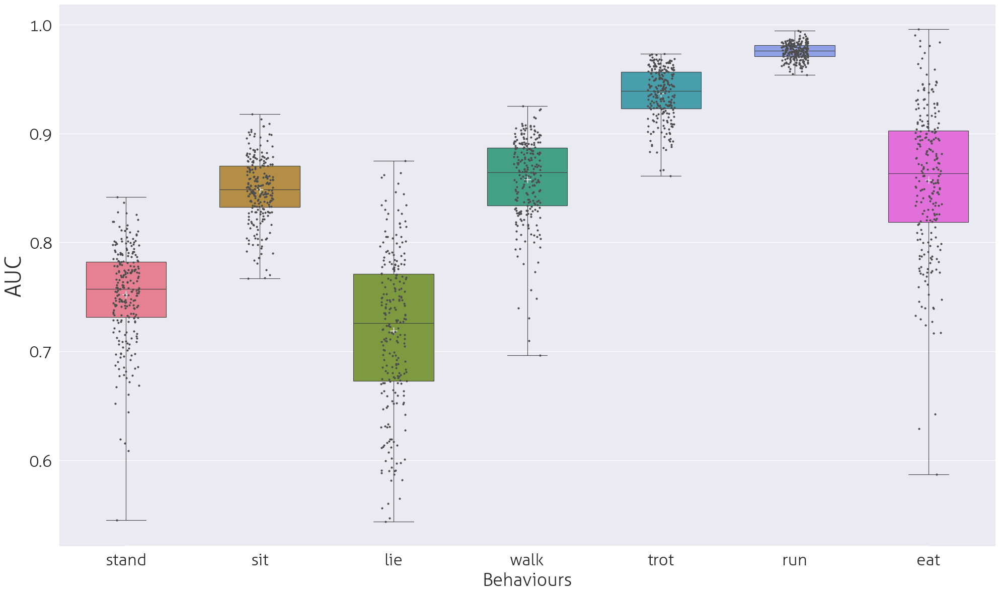

In [82]:
import matplotlib.pyplot as plt


sns.set_theme(style="whitegrid")
sns.set(font=prop.get_name())

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(24, 14))

# fig.suptitle(str(currentLabel)+' AUC by bout mean group', fontsize=40)
# fig.suptitle('Performance of the machine learning classification by window size', fontsize=40)


# Plot the orbital period with horizontal boxes
sns.boxplot(x=dfLabel2.label, y=dfLabel2.auc_vl, data=dfLabel2.auc_vl,
            whis=[0, 100], width=.6, palette="husl", linewidth = 0.8, showmeans=True,
                       meanprops={"marker": "+", 
                       "markeredgecolor": "white", 
                       "markersize": "10"})

# Add in points to show each observation
sns.stripplot(x=dfLabel2.label, y=dfLabel2.auc_vl, data=dfLabel2.auc_vl,
              size=3, color=".3", linewidth=0)

# Tweak the visual presentation
ax.yaxis.grid(True)
sns.despine(trim=True, left=True)

# plt.title(plot_str, size=32)
plt.xlabel('Behaviours', size =26)
plt.ylabel('AUC',fontsize=32)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

fileName = path_figures + '_AUC_by_behaviour_' +'summary_graph.png'

plt.savefig(fileName)

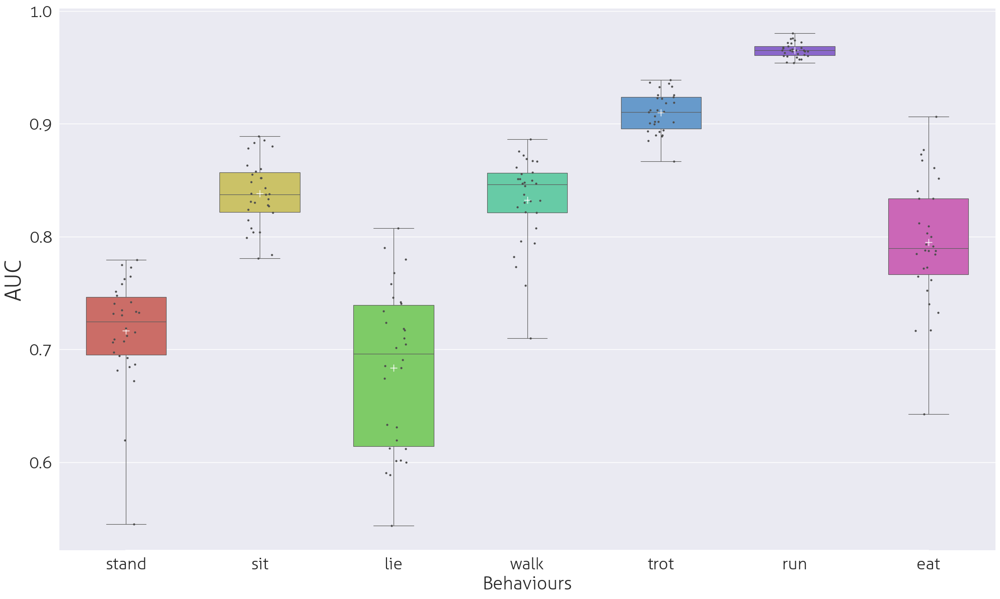

In [83]:
import matplotlib.pyplot as plt


sns.set_theme(style="whitegrid")
sns.set(font=prop.get_name())

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(24, 14))

# fig.suptitle(str(currentLabel)+' AUC by bout mean group', fontsize=40)
# fig.suptitle('Performance of the machine learning classification by window size', fontsize=40)


# Plot the orbital period with horizontal boxes
sns.boxplot(x=dfLabel5.label, y=dfLabel5.auc_vl, data=dfLabel5.auc_vl,
            whis=[0, 100], width=.6, palette="hls", linewidth = 0.8, showmeans=True,
                       meanprops={"marker": "+", 
                       "markeredgecolor": "white", 
                       "markersize": "10"})

# Add in points to show each observation
sns.stripplot(x=dfLabel5.label, y=dfLabel5.auc_vl, data=dfLabel5.auc_vl,
              size=3, color=".3", linewidth=0)

# Tweak the visual presentation
ax.yaxis.grid(True)
sns.despine(trim=True, left=True)

# plt.title(plot_str, size=32)
plt.xlabel('Behaviours', size =26)
plt.ylabel('AUC',fontsize=32)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

fileName = path_figures + '_AUC_by_behaviour_' +'summary_graph.png'

plt.savefig(fileName)

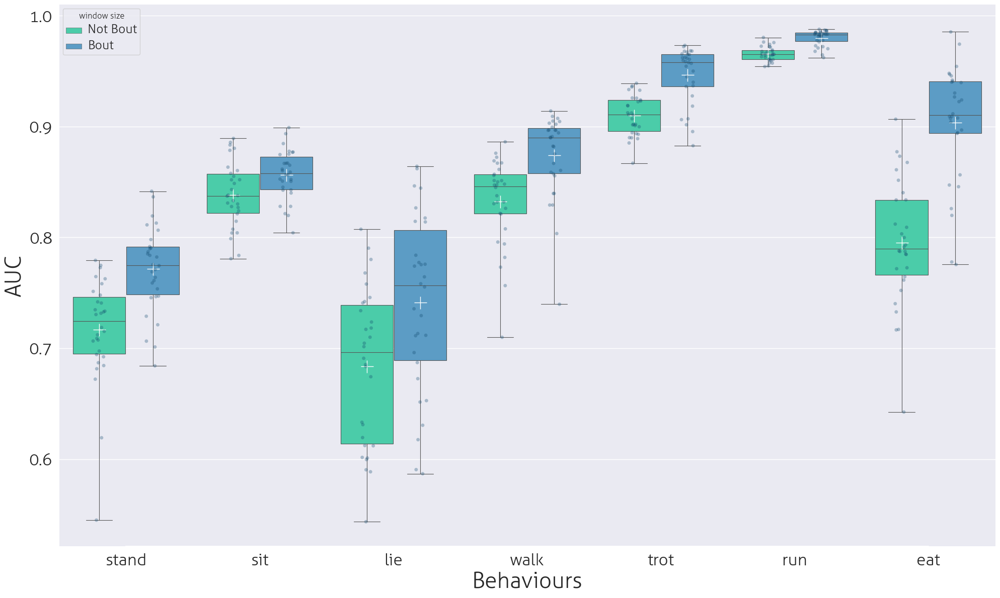

In [84]:
import matplotlib.pyplot as plt
import seaborn.objects as so

sns.set_theme(style="whitegrid")
sns.set(font=prop.get_name())

# Initialize the figure with a logarithmic x axis
fig, ax = plt.subplots(figsize=(24, 14))

# fig.suptitle(str(currentLabel)+' AUC by bout mean group', fontsize=40)
# fig.suptitle('Performance of the machine learning classification by window size', fontsize=40)


# Plot the orbital period with horizontal boxes
sns.boxplot(x = 'label', y = 'auc_vl',
                hue = 'window size',
                data = df_combined,
                whis=[0, 100], 
                # width=.6,
                palette=['#35e2b3', '#4ba0d6'],
                linewidth = 0.8,
                showmeans=True,
                meanprops={"marker": "+", 
                "markeredgecolor": "white", 
                "markersize": "18"})

# Add in points to show each observation
# sns.stripplot(x ='label', y='auc_vl', hue = 'dataset', data = df_combined,
#               size=4, palette=['#4ed6ea', '#3350be'], linewidth=0)

sns.stripplot(y='auc_vl', x='label',
                   hue='window size',
                   data=df_combined,
                   legend=False,
                   jitter=True,
                   dodge=True,
                   marker='o', 
                   alpha=0.3,
                   palette=['#0e476c', '#0e476c'])

# Tweak the visual presentation
ax.yaxis.grid(True)
sns.despine(trim=True, left=True)

# plt.title(plot_str, size=32)
plt.setp(ax.get_legend().get_texts(), fontsize='18')
plt.xlabel('Behaviours', size =32)
plt.ylabel('AUC',fontsize=32)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

fileName = path_figures + '_AUC_by_behaviour_bout_optimal_' +'summary_graph.png'

plt.savefig(fileName)